In [102]:
pip install lime

In [103]:
import pandas as pd
df = pd.read_csv("/content/Chromium_trad.csv")
df.head()

,title,label
0,Issue 2 : Testing if chromium id works 2 probl...,0
1,Issue 3 : This is a test 3 problem? 1. eat 2. ...,0
2,Issue 4 : Scrolling with some scroll mice (tou...,0
3,Issue 5 : Java not working yet nbsp; nbsp;...,0
4,Issue 6 : Chrome treats links in frames differ...,0


In [104]:
# Data Analysis
import pandas as pd
import numpy as np

# Data Visualization
from matplotlib import pyplot as plt
import seaborn as sns

# Machine Learning
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

# NLP
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from wordcloud import WordCloud, STOPWORDS
import re

# Warning
import warnings
warnings.filterwarnings('ignore')

Train and Test CSV files

In [105]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Load your CSV file into a pandas DataFrame
data = pd.read_csv("/content/Chromium_trad.csv")

# Split the data into features (X) and target variable (y) assuming the last column is the target variable
X = data.iloc[:, :-1]  # Features
y = data.iloc[:, -1]   # Target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Concatenate features and target variable for training and testing sets
train_data = pd.concat([X_train, y_train], axis=1)
test_data = pd.concat([X_test, y_test], axis=1)

# Save the training and testing data to CSV files
train_data.to_csv("train.csv", index=False)
test_data.to_csv("test.csv", index=False)


In [106]:
# Loading train data
train_df = pd.read_csv('/content/train.csv')
print(f'Train data shape: {train_df.shape}')
train_df.head()

Train data shape: (33552, 2)


,title,label
0,Issue 184 : Caption Button Spacing 2 problem? ...,0
1,Issue 44378 : System-level toast should write ...,0
2,Issue 9313 : aviationweek.com looks terrible ...,0
3,Issue 33470 : OpenSuse : quot;/lib64/libz.so....,0
4,Issue 45787 : Problem on Acer Aspire 5738DG 2 ...,0


In [107]:
# Loading test data
test_df = pd.read_csv('/content/test.csv')
print(f'Test data shape: {test_df.shape}')
test_df.head()

Test data shape: (8388, 2)


,title,label
0,Issue 21856 : Lost access to extensions bar 1 ...,0
1,Issue 9450 : WebCore::V8Proxy::RegisterGlobalH...,1
2,Issue 34594 : Chromium Crash on multiple windo...,0
3,Issue 27971 : No master password to protect st...,0
4,Issue 27880 : bugreport.apple.com login redire...,0


In [108]:
# Duplicates check
train_df.duplicated().sum()

0

In [109]:
# Data types check
train_df.dtypes

title    object
label     int64
dtype: object

In [110]:
# Missing values check
print(f'Missing values in train data:\n{train_df.isnull().sum()}')
print('-'*40)
print(f'Missing values in test data:\n{test_df.isnull().sum()}')

Missing values in train data:
title    0
label    0
dtype: int64
----------------------------------------
Missing values in test data:
title    0
label    0
dtype: int64


In [111]:
import pandas as pd

# Assuming you have already loaded your train and test DataFrames as train_df and test_df

# Remove missing values from the train DataFrame
train_df = train_df.dropna()

# Remove missing values from the test DataFrame
test_df = test_df.dropna()

# Check if missing values are removed
print(f'Missing values in train data after removal:\n{train_df.isnull().sum()}')
print('-'*40)
print(f'Missing values in test data after removal:\n{test_df.isnull().sum()}')

Missing values in train data after removal:
title    0
label    0
dtype: int64
----------------------------------------
Missing values in test data after removal:
title    0
label    0
dtype: int64


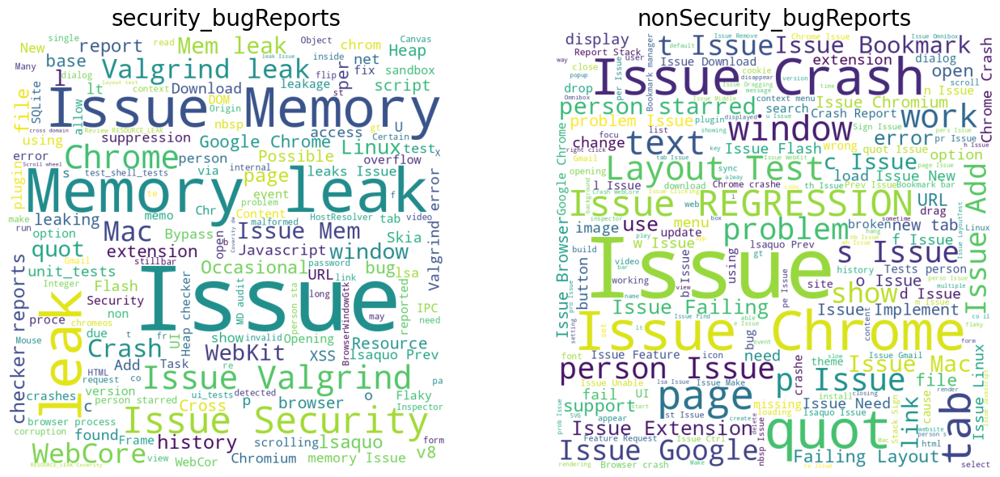

In [112]:
# Plotting wordclouds
stopwords = set(STOPWORDS)

security_bugReports = train_df['title'][train_df['label']==1].to_string()
wordcloud_negative = WordCloud(width = 800, height = 800,
                               background_color ='white', stopwords = stopwords,
                               min_font_size = 10).generate(security_bugReports)

nonSecurity_bugReports = train_df['title'][train_df['label']==0].to_string()
wordcloud_positive = WordCloud(width = 800, height = 800,
                               background_color ='white', stopwords = stopwords,
                               min_font_size = 10).generate(nonSecurity_bugReports)

# Plotting the WordCloud images
plt.figure(figsize=(14, 6), facecolor = None)

plt.subplot(1, 2, 1)
plt.imshow(wordcloud_negative)
plt.axis("off")
plt.title('security_bugReports', fontdict={'fontsize': 20})

plt.subplot(1, 2, 2)
plt.imshow(wordcloud_positive)
plt.axis("off")
plt.title('nonSecurity_bugReports', fontdict={'fontsize': 20})

plt.tight_layout()
plt.show()

Data Preprocessing

In [113]:
# Train-Test Splitting
X = train_df.drop(columns=['label'])
y = train_df['label']
test = test_df
print(X.shape, test.shape, y.shape)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(33552, 1) (8388, 2) (33552,)
(26841, 1) (6711, 1) (26841,) (6711,)


In [114]:
X_train.dtypes

title    object
dtype: object

Text Normalization

In [115]:
# Function to tokenize and clean the text
def tokenize_and_clean(text):
    # Changing case of the text to lower case
    lowered = text.lower()

    # Cleaning the text
    cleaned = re.sub('@user', '', lowered)

    # Tokenization
    tokens = word_tokenize(cleaned)
    filtered_tokens = [token for token in tokens if re.match(r'\w{1,}', token)]

    # Stemming
    stemmer = PorterStemmer()
    stems = [stemmer.stem(token) for token in filtered_tokens]
    return stems

**Vectorization**

In [116]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [117]:
# BOW Vectorization

# TF-IDF Vectorization
tfidf_vectorizer = TfidfVectorizer(tokenizer=tokenize_and_clean, stop_words='english')
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train['title'])
X_test_tfidf = tfidf_vectorizer.transform(X_test['title'])
print(X_train_tfidf.shape, X_test_tfidf.shape)

# TF-IDF Vectorization on full training data
tfidf_vectorizer_full = TfidfVectorizer(tokenizer=tokenize_and_clean, stop_words='english')
X_tfidf = tfidf_vectorizer_full.fit_transform(X['title'])
test_tfidf = tfidf_vectorizer_full.transform(test['title'])
print(X_tfidf.shape, test_tfidf.shape)

(26841, 163896) (6711, 163896)
(33552, 194920) (8388, 194920)


**SMOTE**

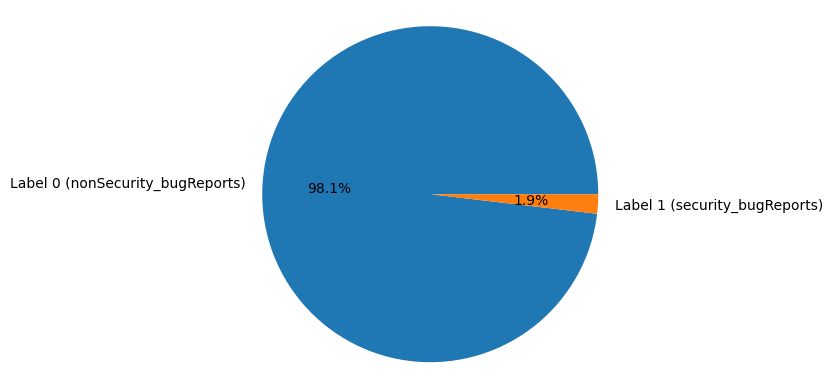

In [118]:
# Class Imbalance Check
plt.pie(y_train.value_counts(),
        labels=['Label 0 (nonSecurity_bugReports)', 'Label 1 (security_bugReports)'],
        autopct='%0.1f%%')
plt.axis('equal')
plt.show()

(52682, 163896) (52682,)
(65838, 194920) (65838,)


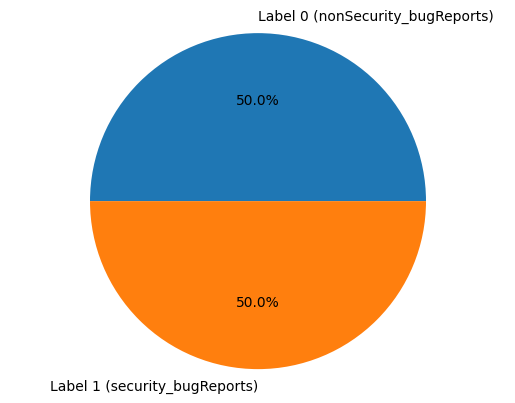

In [119]:
# SMOTE to deal with the class imbalance
smote = SMOTE()
X_train_smote, y_train_smote = smote.fit_resample(X_train_tfidf, y_train.values)
print(X_train_smote.shape, y_train_smote.shape)

# SMOTE on full training data
smote = SMOTE()
X_smote, y_smote = smote.fit_resample(X_tfidf, y.values)
print(X_smote.shape, y_smote.shape)

# Class Imbalance Check
plt.pie(pd.value_counts(y_train_smote),
        labels=['Label 0 (nonSecurity_bugReports)', 'Label 1 (security_bugReports)'],
        autopct='%0.1f%%')
plt.axis('equal')
plt.show()

ML **Modeling**

In [120]:
# Functions to print scores
def training_scores(y_act, y_pred):
    acc = round(accuracy_score(y_act, y_pred), 3)
    f1 = round(f1_score(y_act, y_pred), 3)
    print(f'Training Scores: Accuracy={acc}, F1-Score={f1}')

def validation_scores(y_act, y_pred):
    acc = round(accuracy_score(y_act, y_pred), 3)
    f1 = round(f1_score(y_act, y_pred), 3)
    print(f'Validation Scores: Accuracy={acc}, F1-Score={f1}')

In [121]:
# Logistic Regression
lr = LogisticRegression()
lr.fit(X_train_smote, y_train_smote)
y_train_pred = lr.predict(X_train_smote)
y_test_pred = lr.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=0.996, F1-Score=0.996
Validation Scores: Accuracy=0.983, F1-Score=0.635


--------------------------**LIME for Logistic Regression**----------------------

In [122]:
from lime.lime_text import LimeTextExplainer
class_names = list(train_df.label.unique())
explainer = LimeTextExplainer(class_names=class_names)

In [123]:
max_features = train_df.title.str.split().map(lambda x: len(x)).max()
print(max_features)

2285


In [124]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, lr)

In [125]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

2702


In [126]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.98275425 0.01724575]]

Explanation as a list of weighted features


[('gallery', 0.03537609911631002),
 ('themes', -0.03473105674215393),
 ('Theme', -0.013907553913124466),
 ('chrome', -0.010128919633271003),
 ('Feature', -0.009630088362112947)]

In [127]:
[test.title.iloc[idx]]

['Issue 36040 : Feature: Theme submission to google chrome themes gallery 1 person starred this issue and may be notified of changes.    nbsp;   divilex@hotmail.com    Developers should be able to submit themes to the google chrome themes gallery. ']

In [128]:
exp.show_in_notebook(text=True)

In [129]:
# Naive Bayes Classifier
mnb = MultinomialNB()
mnb.fit(X_train_smote, y_train_smote)
y_train_pred = mnb.predict(X_train_smote)
y_test_pred = mnb.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=0.976, F1-Score=0.976
Validation Scores: Accuracy=0.949, F1-Score=0.355


--------------------------**LIME for Naive Bayes**----------------------

In [130]:
from lime.lime_text import LimeTextExplainer
class_names = list(train_df.label.unique())
explainer = LimeTextExplainer(class_names=class_names)

In [131]:
max_features = train_df.title.str.split().map(lambda x: len(x)).max()
print(max_features)

2285


In [132]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, mnb)

In [133]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

2702


In [134]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.99403376 0.00596624]]

Explanation as a list of weighted features


[('themes', -0.06758222953643701),
 ('Theme', -0.04017400477532891),
 ('divilex', -0.031020593860461528),
 ('gallery', 0.02118891631811327),
 ('hotmail', -0.017527379553461776)]

In [135]:
[test.title.iloc[idx]]

['Issue 36040 : Feature: Theme submission to google chrome themes gallery 1 person starred this issue and may be notified of changes.    nbsp;   divilex@hotmail.com    Developers should be able to submit themes to the google chrome themes gallery. ']

In [136]:
exp.show_in_notebook(text=True)

In [137]:
# Random Forest Classifier
rf = RandomForestClassifier()
rf.fit(X_train_smote, y_train_smote)
y_train_pred = rf.predict(X_train_smote)
y_test_pred = rf.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=1.0, F1-Score=1.0
Validation Scores: Accuracy=0.988, F1-Score=0.551


----------------------**lime for Random Forest Classifier**---------------------

In [138]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, rf)

In [139]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

2702


In [140]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[1. 0.]]

Explanation as a list of weighted features


[('changes', -0.00941342393922617),
 ('notified', -0.004527213361665296),
 ('1', -0.003816260952898237),
 ('themes', -0.003632445535828801),
 ('starred', 0.0036151539515732367)]

In [141]:
[test.title.iloc[idx]]

['Issue 36040 : Feature: Theme submission to google chrome themes gallery 1 person starred this issue and may be notified of changes.    nbsp;   divilex@hotmail.com    Developers should be able to submit themes to the google chrome themes gallery. ']

In [142]:
exp.show_in_notebook(text=True)

In [143]:
# Extreme Gradient Boosting Classifier
xgb = XGBClassifier(objective='binary:logistic', eval_metric='logloss')
xgb.fit(X_train_smote, y_train_smote)
y_train_pred = xgb.predict(X_train_smote)
y_test_pred = xgb.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=1.0, F1-Score=1.0
Validation Scores: Accuracy=0.994, F1-Score=0.826


---------------------**lime for Extreme Gradient Boosting**---------------------

In [144]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, xgb)

In [145]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

2702


In [146]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.9976951  0.00230491]]

Explanation as a list of weighted features


[('nbsp', 0.0022112734272427877),
 ('chrome', -0.0004757840195208307),
 ('themes', 0.00044050959753422057),
 ('1', -0.0003454893796241164),
 ('person', -0.0003148198288337456)]

In [147]:
[test.title.iloc[idx]]

['Issue 36040 : Feature: Theme submission to google chrome themes gallery 1 person starred this issue and may be notified of changes.    nbsp;   divilex@hotmail.com    Developers should be able to submit themes to the google chrome themes gallery. ']

In [148]:
exp.show_in_notebook(text=True)

In [149]:
pip install lime

**SMOTE WITH 60:40 RATIO**

(42145, 163896) (42145,)
(65838, 194920) (65838,)


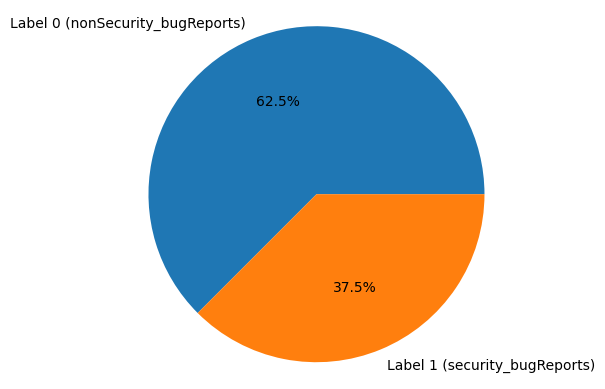

In [150]:
# SMOTE to deal with the class imbalance
smote = SMOTE(sampling_strategy=0.6)
X_train_smote, y_train_smote = smote.fit_resample(X_train_tfidf, y_train.values)
print(X_train_smote.shape, y_train_smote.shape)

# SMOTE on full training data
smote = SMOTE()
X_smote, y_smote = smote.fit_resample(X_tfidf, y.values)
print(X_smote.shape, y_smote.shape)

# Class Imbalance Check
plt.pie(pd.value_counts(y_train_smote),
        labels=['Label 0 (nonSecurity_bugReports)', 'Label 1 (security_bugReports)'],
        autopct='%0.1f%%')
plt.axis('equal')
plt.show()

In [151]:
# Functions to print scores
def training_scores(y_act, y_pred):
    acc = round(accuracy_score(y_act, y_pred), 3)
    f1 = round(f1_score(y_act, y_pred), 3)
    print(f'Training Scores: Accuracy={acc}, F1-Score={f1}')

def validation_scores(y_act, y_pred):
    acc = round(accuracy_score(y_act, y_pred), 3)
    f1 = round(f1_score(y_act, y_pred), 3)
    print(f'Validation Scores: Accuracy={acc}, F1-Score={f1}')

In [152]:
# Logistic Regression
lr = LogisticRegression()
lr.fit(X_train_smote, y_train_smote)
y_train_pred = lr.predict(X_train_smote)
y_test_pred = lr.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=0.995, F1-Score=0.994
Validation Scores: Accuracy=0.985, F1-Score=0.662


---------------------**lime for Logistic Regression**---------------------

In [153]:
from lime.lime_text import LimeTextExplainer
class_names = list(train_df.label.unique())
explainer = LimeTextExplainer(class_names=class_names)

In [154]:
max_features = train_df.title.str.split().map(lambda x: len(x)).max()
print(max_features)

2285


In [155]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, lr)

In [156]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

2702


In [157]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.98768834 0.01231166]]

Explanation as a list of weighted features


[('themes', -0.021307680752231103),
 ('gallery', 0.015305875489601216),
 ('Theme', -0.00902640730976502),
 ('chrome', -0.006718188062299617),
 ('submission', 0.005835267911169563)]

In [158]:
[test.title.iloc[idx]]

['Issue 36040 : Feature: Theme submission to google chrome themes gallery 1 person starred this issue and may be notified of changes.    nbsp;   divilex@hotmail.com    Developers should be able to submit themes to the google chrome themes gallery. ']

In [159]:
exp.show_in_notebook(text=True)

In [160]:
# Naive Bayes Classifier
mnb = MultinomialNB()
mnb.fit(X_train_smote, y_train_smote)
y_train_pred = mnb.predict(X_train_smote)
y_test_pred = mnb.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=0.963, F1-Score=0.95
Validation Scores: Accuracy=0.968, F1-Score=0.422


----------------------------**lime for Naive Bayes**----------------------------

In [161]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, mnb)

In [162]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

2702


In [163]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.99822497 0.00177503]]

Explanation as a list of weighted features


[('themes', -0.02172933339204899),
 ('Theme', -0.013485263138152037),
 ('divilex', -0.009427888434131873),
 ('hotmail', -0.007308912884335088),
 ('Feature', -0.004893584880108018)]

In [164]:
[test.title.iloc[idx]]

['Issue 36040 : Feature: Theme submission to google chrome themes gallery 1 person starred this issue and may be notified of changes.    nbsp;   divilex@hotmail.com    Developers should be able to submit themes to the google chrome themes gallery. ']

In [165]:
exp.show_in_notebook(text=True)

In [166]:
# Random Forest Classifier
rf = RandomForestClassifier()
rf.fit(X_train_smote, y_train_smote)
y_train_pred = rf.predict(X_train_smote)
y_test_pred = rf.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=1.0, F1-Score=1.0
Validation Scores: Accuracy=0.987, F1-Score=0.553


----------------------**lime for Random Forest Classifier**---------------------

In [167]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, rf)

In [168]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

2702


In [169]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[1. 0.]]

Explanation as a list of weighted features


[('issue', -0.007685900992462682),
 ('Issue', -0.007671458376689818),
 ('person', 0.005639491271224664),
 ('google', -0.0032998099105275673),
 ('able', -0.003075794345141986)]

In [170]:
[test.title.iloc[idx]]

['Issue 36040 : Feature: Theme submission to google chrome themes gallery 1 person starred this issue and may be notified of changes.    nbsp;   divilex@hotmail.com    Developers should be able to submit themes to the google chrome themes gallery. ']

In [171]:
exp.show_in_notebook(text=True)

In [172]:
# Extreme Gradient Boosting Classifier
xgb = XGBClassifier(objective='binary:logistic', eval_metric='logloss')
xgb.fit(X_train_smote, y_train_smote)
y_train_pred = xgb.predict(X_train_smote)
y_test_pred = xgb.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=1.0, F1-Score=1.0
Validation Scores: Accuracy=0.994, F1-Score=0.835


---------------------**lime for Extreme Gradient Boosting**---------------------

In [173]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, xgb)

In [174]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

2702


In [175]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.99825114 0.00174889]]

Explanation as a list of weighted features


[('nbsp', 0.001419239688481059),
 ('chrome', -0.0011591742896540631),
 ('themes', 0.00028208530554904826),
 ('gallery', 0.0001669923000389399),
 ('this', -0.00014736573608305087)]

In [176]:
[test.title.iloc[idx]]

['Issue 36040 : Feature: Theme submission to google chrome themes gallery 1 person starred this issue and may be notified of changes.    nbsp;   divilex@hotmail.com    Developers should be able to submit themes to the google chrome themes gallery. ']

In [177]:
exp.show_in_notebook(text=True)